In [1]:
import cv2
import matplotlib.pyplot as plt
import albumentations as A
import numpy as np

INFO:albumentations.check_version:A new version of Albumentations is available: 1.4.18 (you have 1.4.11). Upgrade using: pip install --upgrade albumentations


In [2]:
def plot_results(original, result):
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    ax = axes.ravel()

    ax[0].imshow(original)
    ax[1].imshow(result)
    
    fig.tight_layout()
    plt.show()


In [3]:
img_cancer = cv2.imread('cancer.png')
img_cancer = cv2.cvtColor(img_cancer, cv2.COLOR_BGR2RGB)
img_mask = cv2.imread('cancer_mask.png')
img_mask = cv2.cvtColor(img_mask, cv2.COLOR_BGR2RGB)
img_mask[img_mask < 128] = 0
img_mask[img_mask >= 128] = 255

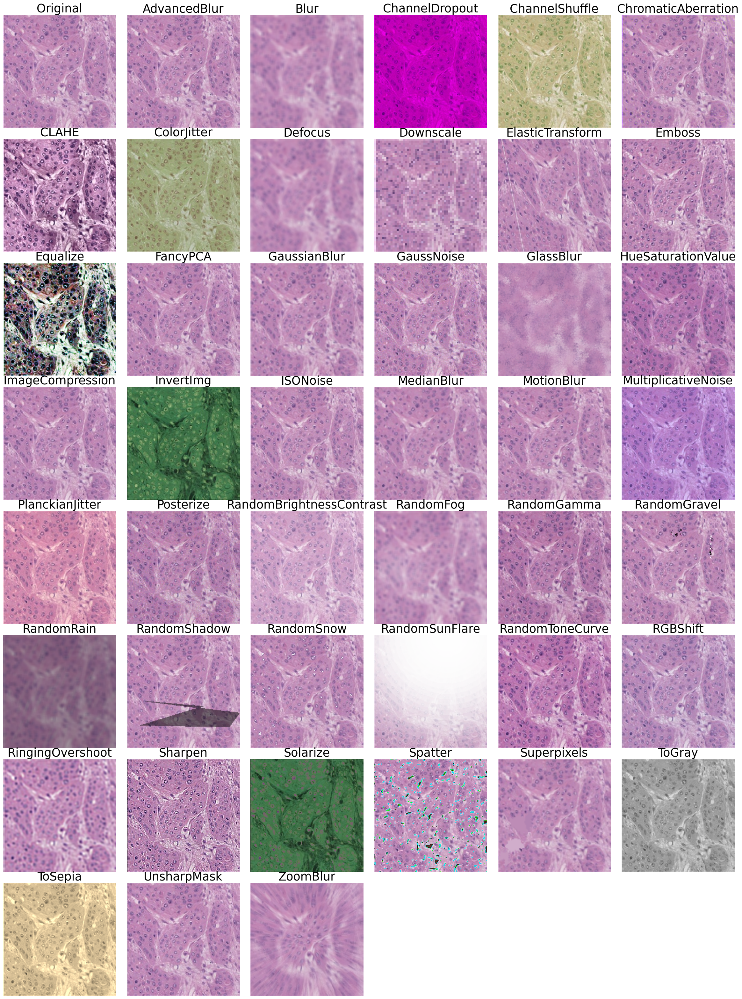

In [4]:
# No mask >> todos adicionados

aug_title = [
'AdvancedBlur',
'Blur',
'ChannelDropout',
'ChannelShuffle',
'ChromaticAberration',
'CLAHE',
'ColorJitter',
'Defocus',
'Downscale',
'ElasticTransform',
'Emboss',
'Equalize',
'FancyPCA',
'GaussianBlur',
'GaussNoise',
'GlassBlur',
'HueSaturationValue',
'ImageCompression',
'InvertImg',
'ISONoise',
'MedianBlur',
'MotionBlur',
'MultiplicativeNoise',
#'Normalize', #WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.1778711..2.6399999].
'PlanckianJitter',
'Posterize',
'RandomBrightnessContrast',
'RandomFog',
'RandomGamma',
'RandomGravel',
'RandomRain',
'RandomShadow',
'RandomSnow',
'RandomSunFlare',
'RandomToneCurve',
'RGBShift',
'RingingOvershoot',
'Sharpen',
'Solarize',
'Spatter',
'Superpixels',
'ToGray',
'ToSepia',
'UnsharpMask',
'ZoomBlur'
]

plt.rcParams.update({'font.size': 22})
fig, axes = plt.subplots(8, 6, figsize=(30, 40), gridspec_kw = {'wspace':0.01, 'hspace':0.1})
ax = axes.ravel()

# Original
ax[0].imshow(img_cancer)
ax[0].title.set_text('Original')
ax[0].set_axis_off()

for i in range(0, len(aug_title)):
    result = getattr(A, aug_title[i])(always_apply=True)(image=img_cancer)
    ax[i+1].imshow(result['image'])
    ax[i+1].title.set_text(aug_title[i])
    ax[i+1].set_axis_off()

for i in range(-4, 0):
    ax[i].set_axis_off()

plt.show()

In [ ]:
# With mask >> os que estão comentados deu erro de compilação; os demais foram adicionados (replicado abaixo)
aug_title = [
'Affine',
#'BBoxSafeRandomCrop',
#'CenterCrop',
'CoarseDropout',
#'Crop',
#'CropAndPad',
#'CropNonEmptyMaskIfExists',
'D4',
'GridDropout',
#'GridElasticDeform', >> AttributeError: module 'albumentations' has no attribute 'GridElasticDeform'
'Lambda',
'LongestMaxSize', 
#'MaskDropout',
'MixUp',
#'OverlayElements',
'PadIfNeeded',
'PiecewiseAffine',
#'RandomCrop',
'RandomCropFromBorders',
#'RandomCropNearBBox', # tem a mais
'RandomGridShuffle',
#'RandomResizedCrop',
'RandomScale',
#'RandomSizedBBoxSafeCrop',
#'RandomSizedCrop',
#'Resize',
'SmallestMaxSize',
'XYMasking',
]

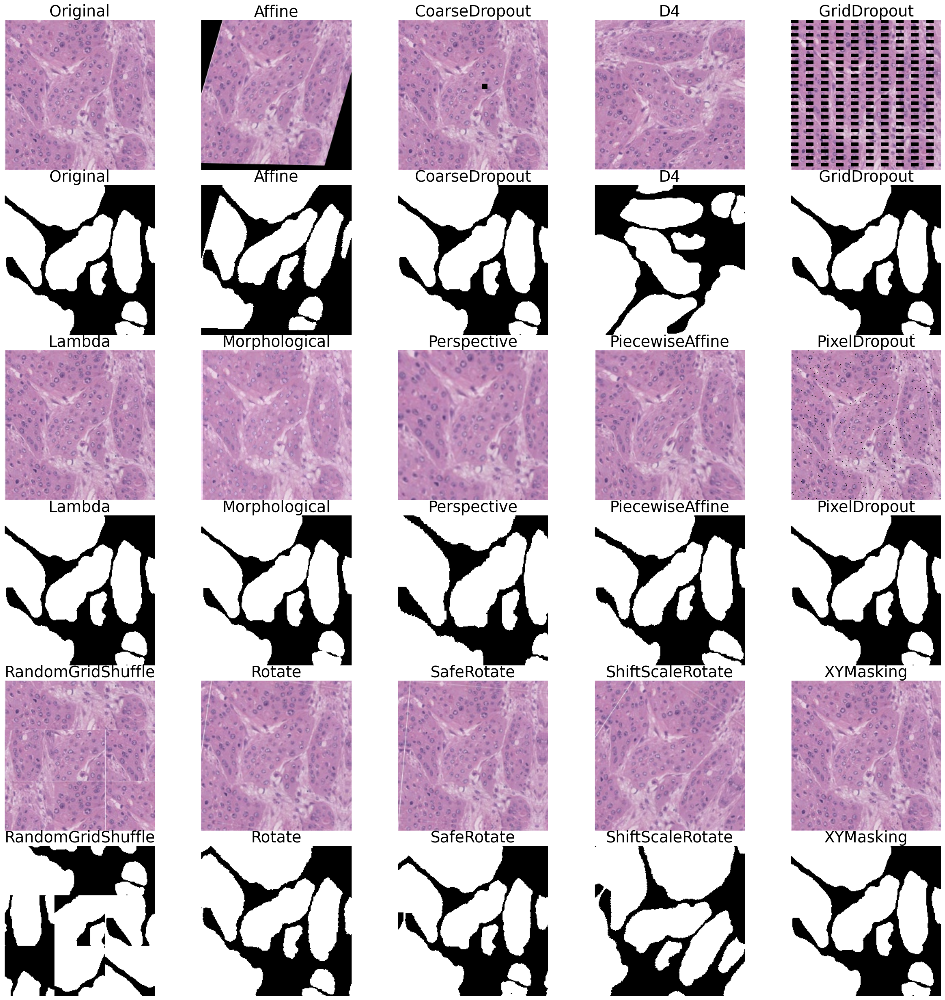

In [6]:
# With mask >> todos adicionados

aug_title = [
'Affine',
'CoarseDropout',
'D4',
'GridDropout',
'Lambda',
###'LongestMaxSize', # Não rodou
###'MixUp', # Needs reference_data=reference_data, read_fn=read_fn
'Morphological',
###'PadIfNeeded', # Não rodou
'Perspective',
'PiecewiseAffine',
'PixelDropout',
###'RandomCropFromBorders', # Não rodou
'RandomGridShuffle',
###'RandomScale',
'Rotate',
'SafeRotate',
'ShiftScaleRotate',
###'SmallestMaxSize', # Não rodou
'XYMasking',
]

plt.rcParams.update({'font.size': 22})
fig, axes = plt.subplots(6, 5, figsize=(30, 30), gridspec_kw = {'wspace':0.01, 'hspace':0.1})
ax = axes.ravel()

# Original
ax[0].imshow(img_cancer)
ax[0].title.set_text('Original')
ax[0].set_axis_off()
ax[5].imshow(img_mask)
ax[5].title.set_text('Original')
ax[5].set_axis_off()


#for i, j in enumerate([n for n in range(1, 6)] + [n for n in range(12, 18)] + [n for n in range(24, 30)] + [n for n in range(36, 42)] + [n for n in range(48, 54)]):
for i, j in enumerate([n for n in range(1, 5)] + [n for n in range(10, 15)] + [n for n in range(20, 25)] + [n for n in range(30, 35)] + [n for n in range(40, 45)]):
    if i >= len(aug_title):
        break
    result = getattr(A, aug_title[i])(always_apply=True)(image=img_cancer, mask=img_mask)
    ax[j].imshow(result['image'])
    ax[j].title.set_text(aug_title[i])
    ax[j].set_axis_off()
    ax[j+5].imshow(result['mask'])
    ax[j+5].title.set_text(aug_title[i])
    ax[j+5].set_axis_off()
    #print(aug_title[i], np.unique(result['mask']))

# ax[-1].set_axis_off()
# ax[-2].set_axis_off()
# ax[-3].set_axis_off()
# ax[-4].set_axis_off()
# ax[-7].set_axis_off()
# ax[-8].set_axis_off()
# ax[-9].set_axis_off()
# ax[-10].set_axis_off()

plt.show()

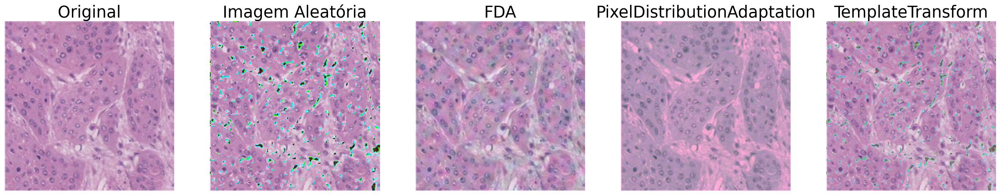

In [90]:
# No mask, needs extra parameter: reference_images/templates >> adicionados, menos HistogramMatching
### Nenhum rodou

aug_title = [
'FDA',
#'HistogramMatching', # Não adicionado
'PixelDistributionAdaptation',
'TemplateTransform',
]


plt.rcParams.update({'font.size': 22})
result1    = getattr(A, 'Spatter')(always_apply=True)(image=img_cancer)
img_target = result1['image']


fig, axes = plt.subplots(1, 5, figsize=(30, 5), gridspec_kw = {'wspace':0.01, 'hspace':0.1})
ax = axes.ravel()

# Original
ax[0].imshow(img_cancer)
ax[0].title.set_text('Original')
ax[0].set_axis_off()

# Imagem aleatória de referência
ax[1].imshow(img_target)
ax[1].title.set_text('Imagem Aleatória')
ax[1].set_axis_off()

i = 0
for i in range(0, len(aug_title)-1):
    result = getattr(A, aug_title[i])(reference_images=[img_target], always_apply=True, read_fn=lambda x: x)(image=img_cancer)
    ax[i+2].imshow(result['image'])
    ax[i+2].title.set_text(aug_title[i])
    ax[i+2].set_axis_off()
    # print(aug_title[i])
    # print(np.unique(result['image']))

i = i + 1
result = getattr(A, aug_title[i])(templates=[img_target], always_apply=True)(image=img_cancer)
ax[i+2].imshow(result['image'])
ax[i+2].title.set_text(aug_title[i])
ax[i+2].set_axis_off()

ax[-1].set_axis_off()

plt.show()

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

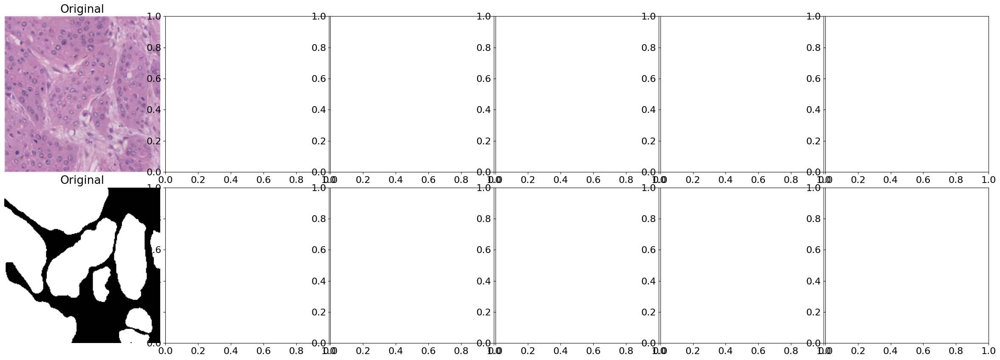

In [79]:
# MixUp (with mask): needs reference_data; execution error

aug_title = [
'MixUp', # Needs reference_data=reference_data, read_fn=read_fn
]

result1    = getattr(A, 'Spatter')(always_apply=True)(image=img_cancer)
img_target = result1['image']

plt.rcParams.update({'font.size': 16})
fig, axes = plt.subplots(2, 6, figsize=(30, 10), gridspec_kw = {'wspace':0.01, 'hspace':0.1})
ax = axes.ravel()

# Original
ax[0].imshow(img_cancer)
ax[0].title.set_text('Original')
ax[0].set_axis_off()
ax[6].imshow(img_mask)
ax[6].title.set_text('Original')
ax[6].set_axis_off()


for i, j in enumerate([n for n in range(1, 6)] + [n for n in range(12, 18)] + [n for n in range(24, 30)] + [n for n in range(36, 42)] + [n for n in range(48, 54)]):
    if i >= len(aug_title):
        break
    result = getattr(A, aug_title[i])(reference_data=[img_target], always_apply=True, read_fn=lambda x: x)(image=img_cancer, mask=img_mask)
    ax[j].imshow(result['image'])
    ax[j].title.set_text(aug_title[i])
    ax[j].set_axis_off()
    ax[j+6].imshow(result['mask'])
    ax[j+6].title.set_text(aug_title[i])
    ax[j+6].set_axis_off()
    #print(aug_title[i], np.unique(result['mask']))

ax[-1].set_axis_off()

plt.show()